Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to C:\Users\Ankur Vasani/.cache\torch\hub\master.zip
YOLOv5  2024-3-10 Python-3.12.1 torch-2.2.1+cpu CPU

Fusing layers... 
Model summary: 157 layers, 7042489 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


 * Serving Flask app '__main__'
 * Debug mode: off


 * Running on http://127.0.0.1:5000
Press CTRL+C to quit


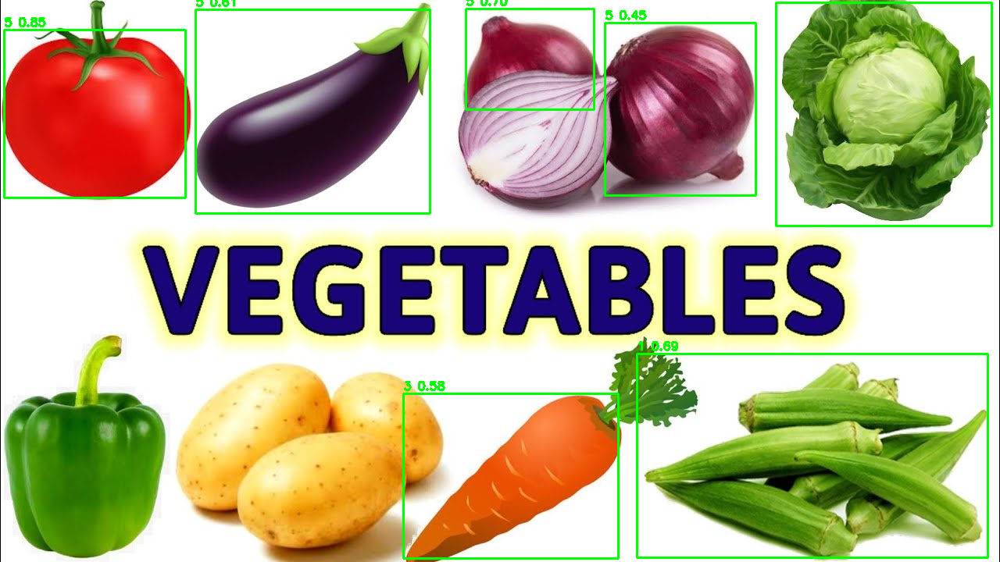

127.0.0.1 - - [10/Mar/2024 15:09:01] "POST /upload HTTP/1.1" 200 -


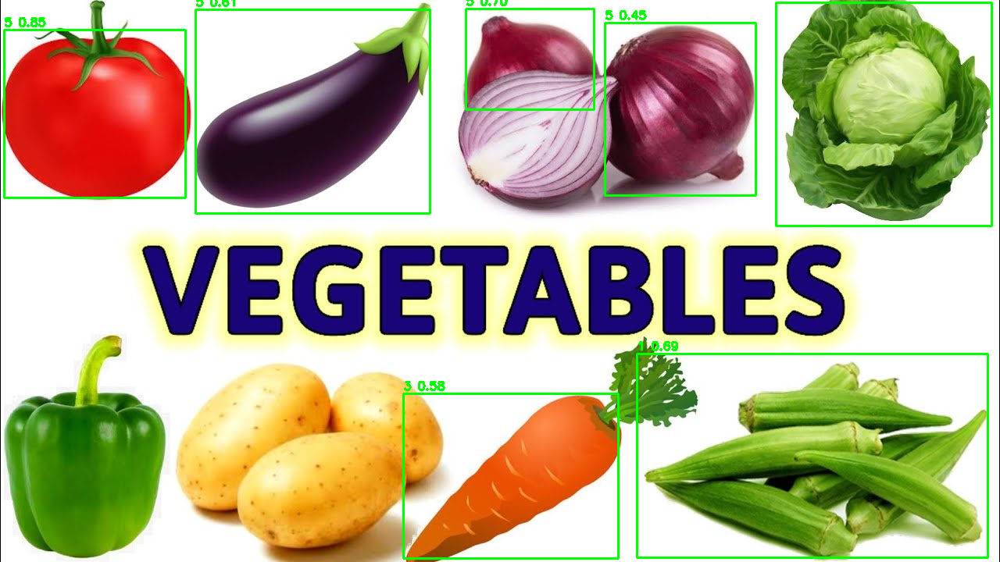

127.0.0.1 - - [10/Mar/2024 15:09:48] "POST /upload HTTP/1.1" 200 -


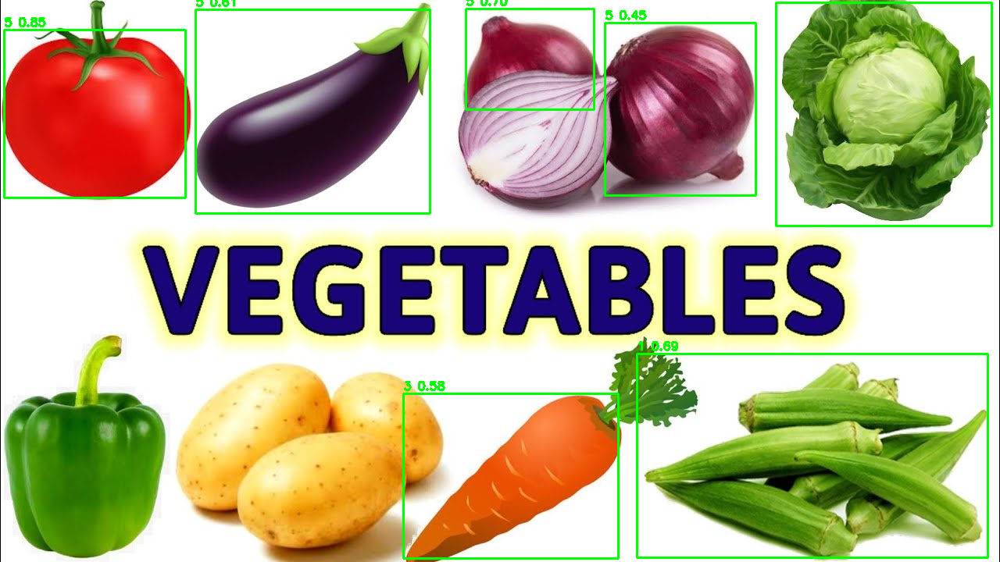

127.0.0.1 - - [10/Mar/2024 15:10:56] "POST /upload HTTP/1.1" 200 -


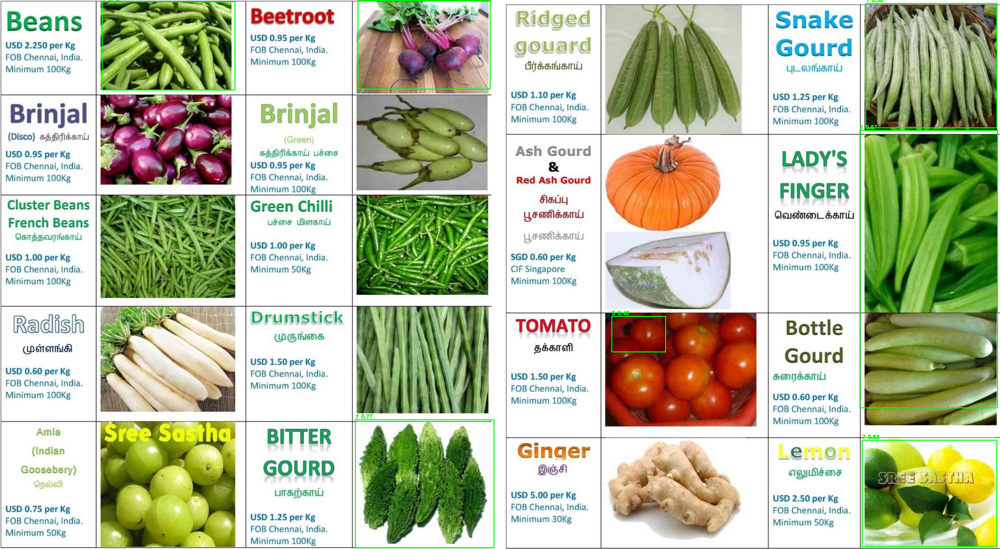

127.0.0.1 - - [10/Mar/2024 15:11:15] "POST /upload HTTP/1.1" 200 -


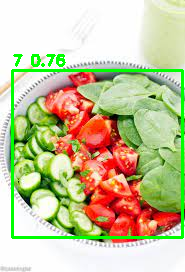

127.0.0.1 - - [10/Mar/2024 15:13:06] "POST /upload HTTP/1.1" 200 -


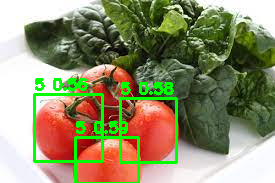

127.0.0.1 - - [10/Mar/2024 15:14:08] "POST /upload HTTP/1.1" 200 -


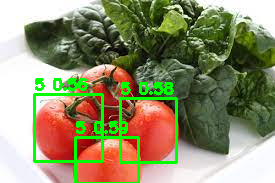

127.0.0.1 - - [10/Mar/2024 15:14:22] "POST /upload HTTP/1.1" 200 -


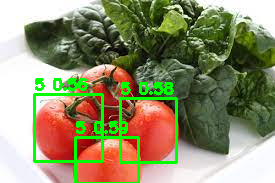

127.0.0.1 - - [10/Mar/2024 15:14:27] "POST /upload HTTP/1.1" 200 -


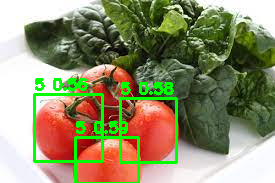

127.0.0.1 - - [10/Mar/2024 15:14:33] "POST /upload HTTP/1.1" 200 -


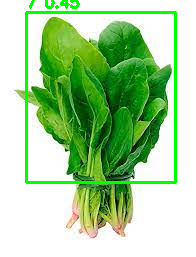

127.0.0.1 - - [10/Mar/2024 15:15:17] "POST /upload HTTP/1.1" 200 -
127.0.0.1 - - [10/Mar/2024 15:19:42] "GET / HTTP/1.1" 404 -
127.0.0.1 - - [10/Mar/2024 15:19:42] "GET /favicon.ico HTTP/1.1" 404 -


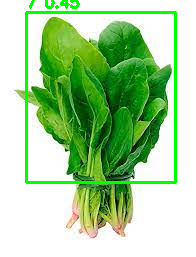

127.0.0.1 - - [10/Mar/2024 15:20:05] "POST /upload HTTP/1.1" 200 -


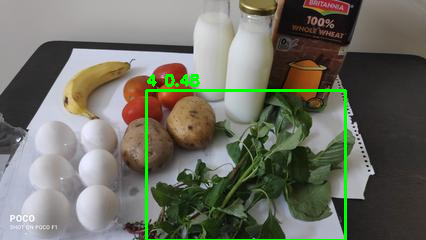

127.0.0.1 - - [10/Mar/2024 15:21:05] "POST /upload HTTP/1.1" 200 -


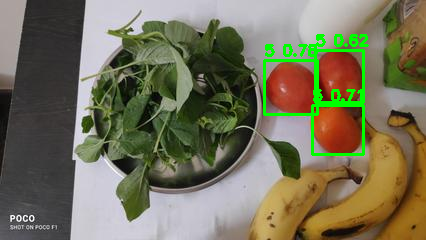

127.0.0.1 - - [10/Mar/2024 15:21:30] "POST /upload HTTP/1.1" 200 -


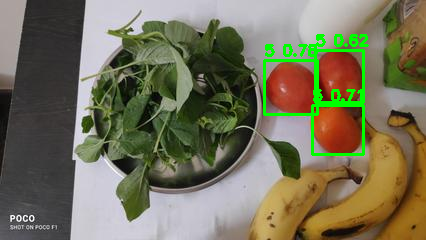

127.0.0.1 - - [10/Mar/2024 15:22:42] "POST /upload HTTP/1.1" 200 -
127.0.0.1 - - [10/Mar/2024 15:23:38] "POST /upload HTTP/1.1" 400 -


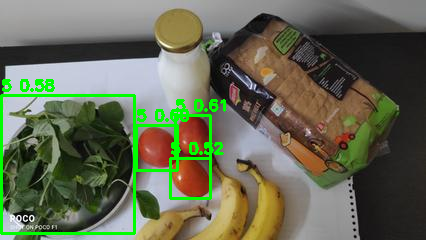

127.0.0.1 - - [10/Mar/2024 15:24:26] "POST /upload HTTP/1.1" 200 -


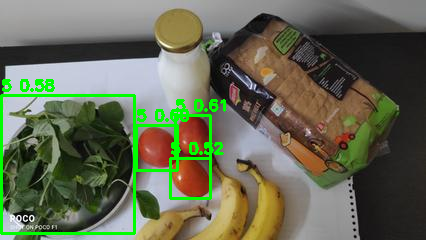

127.0.0.1 - - [10/Mar/2024 15:24:41] "POST /upload HTTP/1.1" 200 -


In [ ]:
import torch
import numpy as np
import cv2
from flask import Flask, request, jsonify
import werkzeug
import datetime
from IPython.display import display, Image

# Update for Windows compatibility
import pathlib
from pathlib import PosixPath, WindowsPath
temp = pathlib.PosixPath
pathlib.PosixPath = pathlib.WindowsPath

# Model loading (outside a function for efficiency)
model_path = 'best.pt'  # Update with your model path
model = torch.hub.load('ultralytics/yolov5', 'custom', path=model_path, force_reload=True)
model.conf = 0.4

app = Flask(__name__)

def draw_boxes(image, results):
    for box, conf, label in zip(results.xyxy[0], results.xyxy[0][:, 4], results.xyxy[0][:, 5]):
        # Extract coordinates
        xmin, ymin, xmax, ymax = map(int, box[:4])
        
        # Draw bounding box
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        
        # Add label and confidence level
        text = f'{int(label)} {conf:.2f}'  # Assuming label is an integer
        cv2.putText(image, text, (xmin, ymin - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

@app.route('/upload', methods=["POST"])
def upload():
    if request.method == "POST":
        imagefile = request.files['image']
        filename = werkzeug.utils.secure_filename(imagefile.filename)
        x = str(datetime.datetime.now())
        filename = "image.jpeg"
        imagefile.save(filename)

        try:
            img = cv2.imread(filename)
            results = model(filename)

            draw_boxes(img, results)
            
            # Convert the image to PNG format for displaying in Jupyter Notebook
            _, img_png = cv2.imencode('.png', img)
            
            # Display the image in the output cell of the Jupyter Notebook
            display(Image(data=img_png))

            detected_objects = [f'{results.names[int(obj[-1])]} {conf:.2f}' for obj, conf in zip(results.xyxy[0], results.xyxy[0][:, 4])]
            response = {
                'message': 'Success',
                'detected_objects': detected_objects
            }
            return jsonify(response)

        except Exception as e:
            print(f"Error during object detection: {e}")
            return jsonify({'message': 'Error: Object detection failed'}), 500

if __name__ == "__main__":
    app.run(debug=False, port=5000)


In [ ]:
import torch
import numpy as np
import cv2
from flask import Flask, request, jsonify
import werkzeug
import datetime
from IPython.display import display, Image
from inference_sdk import InferenceHTTPClient

# Update for Windows compatibility
import pathlib
from pathlib import PosixPath, WindowsPath
temp = pathlib.PosixPath
pathlib.PosixPath = pathlib.WindowsPath

# Model loading (outside a function for efficiency)
CLIENT = InferenceHTTPClient(
    api_url="https://detect.roboflow.com",
    api_key="zNeRF2bZlwDgvkIf3IUf"
)

app = Flask(__name__)

def draw_boxes(image, results):
    for box, conf, label in zip(results.xyxy[0], results.xyxy[0][:, 4], results.xyxy[0][:, 5]):
        # Extract coordinates
        xmin, ymin, xmax, ymax = map(int, box[:4])
        
        # Draw bounding box
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        
        # Add label and confidence level
        text = f'{int(label)} {conf:.2f}'  # Assuming label is an integer
        cv2.putText(image, text, (xmin, ymin - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

@app.route('/upload', methods=["POST"])
def upload():
    if request.method == "POST":
        imagefile = request.files['image']
        filename = werkzeug.utils.secure_filename(imagefile.filename)
        x = str(datetime.datetime.now())
        filename = "image.jpeg"
        imagefile.save(filename)

        try:
            img = cv2.imread(filename)
            detect = CLIENT.infer("image.jpeg", model_id="final_year_final_train/2")
            for 
            draw_boxes(img, results)
            
            # Convert the image to PNG format for displaying in Jupyter Notebook
            _, img_png = cv2.imencode('.png', img)
            
            # Display the image in the output cell of the Jupyter Notebook
            display(Image(data=img_png))

            detected_objects = [f'{results.names[int(obj[-1])]} {conf:.2f}' for obj, conf in zip(results.xyxy[0], results.xyxy[0][:, 4])]
            response = {
                'message': 'Success',
                'detected_objects': detected_objects
            }
            return jsonify(response)

        except Exception as e:
            print(f"Error during object detection: {e}")
            return jsonify({'message': 'Error: Object detection failed'}), 500

if __name__ == "__main__":
    app.run(debug=False, port=5000)


In [6]:
# import the inference-sdk
from inference_sdk import InferenceHTTPClient

# initialize the client
CLIENT = InferenceHTTPClient(
    api_url="https://detect.roboflow.com",
    api_key="zNeRF2bZlwDgvkIf3IUf"
)

# infer on a local image
result = CLIENT.infer("image.jpeg", model_id="final_year_final_train/2")
print(result)

{'time': 0.0328584649998902, 'image': {'width': 426, 'height': 240}, 'predictions': [{'x': 175.5, 'y': 159.0, 'width': 75.0, 'height': 72.0, 'confidence': 0.4734731614589691, 'class': 'Fresh_tomato', 'class_id': 4, 'detection_id': '14854da5-fd68-4485-b5d9-e7e810e3fbca'}]}


In [1]:
from flask import Flask, request, jsonify
import datetime
import cv2
import numpy as np
import requests
from inference_sdk import InferenceHTTPClient, InferenceConfiguration

custom_configuration = InferenceConfiguration(confidence_threshold=0.1)
CLIENT = InferenceHTTPClient(
    api_url="https://detect.roboflow.com",
    api_key="zNeRF2bZlwDgvkIf3IUf"
)
app = Flask(__name__)

def draw_boxes(image, predictions):
    for prediction in predictions:
        x, y, width, height = map(int, [prediction['x'], prediction['y'], prediction['width'], prediction['height']])
        confidence = prediction['confidence']
        class_name = prediction['class']

        # Draw bounding box
        cv2.rectangle(image, (x, y), (x + width, y + height), (0, 255, 0), 2)

        # Add label and confidence level
        text = f'{class_name} {confidence:.2f}'
        cv2.putText(image, text, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

@app.route('/upload', methods=["POST"])
def upload():
    if request.method == "POST":
        imagefile = request.files['image']
        filename = "image.jpeg"  # Save the file with the same name for consistency

        # Save the uploaded image
        imagefile.save(filename)

        try:
            # Infer using the InferenceHTTPClient
            with CLIENT.use_configuration(custom_configuration):
                result = CLIENT.infer(filename, model_id="final_year_final_train/2")

            # Load the image for drawing boxes
            img = cv2.imread(filename)

            # Draw boxes on the image
            draw_boxes(img, result['predictions'])

            # Convert the image to PNG format for displaying in Jupyter Notebook
            _, img_png = cv2.imencode('.png', img)

            # Display the image in the output cell of the Jupyter Notebook
            detected_objects = [f"{prediction['class']} {prediction['confidence']:.2f}" for prediction in result['predictions']]
            response = {
                'message': 'Success',
                'detected_objects': detected_objects
            }
            return jsonify(response)

        except Exception as e:
            print(f"Error during object detection: {e}")
            return jsonify({'message': 'Error: Object detection failed'}), 500

if __name__ == "__main__":
    app.run(debug=False, port=5000)


 * Serving Flask app '__main__'
 * Debug mode: off


 * Running on http://127.0.0.1:5000
Press CTRL+C to quit
127.0.0.1 - - [26/Mar/2024 17:15:25] "POST /upload HTTP/1.1" 200 -


In [ ]:
from flask import Flask, request, jsonify
import datetime
import cv2
import numpy as np
import requests
from inference_sdk import InferenceHTTPClient, InferenceConfiguration

custom_configuration = InferenceConfiguration(confidence_threshold=0.4)
CLIENT = InferenceHTTPClient(
    api_url="https://detect.roboflow.com",
    api_key="zNeRF2bZlwDgvkIf3IUf"
)
app = Flask(__name__)

def draw_boxes(image, predictions):
    for prediction in predictions:
        x, y, width, height = map(int, [prediction['x'], prediction['y'], prediction['width'], prediction['height']])
        confidence = prediction['confidence']
        class_name = prediction['class']

        # Draw bounding box
        cv2.rectangle(image, (x, y), (x + width, y + height), (0, 255, 0), 2)

        # Add label and confidence level
        text = f'{class_name} {confidence:.2f}'
        cv2.putText(image, text, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

@app.route('/upload', methods=["POST"])
def upload():
    if request.method == "POST":
        imagefile = request.files['image']
        filename = "image.jpeg"  # Save the file with the same name for consistency

        # Save the uploaded image
        imagefile.save(filename)

        try:
            # Infer using the InferenceHTTPClient
            with CLIENT.use_configuration(custom_configuration):
                result = CLIENT.infer(filename, model_id="final_year_final_train/2")

            # Load the image for drawing boxes
            img = cv2.imread(filename)

            # Draw boxes on the image
            draw_boxes(img, result['predictions'])

            # Convert the image to PNG format for displaying in Jupyter Notebook
            _, img_png = cv2.imencode('.png', img)

            # Display the image in the output cell of the Jupyter Notebook
            detected_objects = [f"{prediction['class']} {prediction['confidence']:.2f}" for prediction in result['predictions']]
            
            response = {
                'message': 'Success',
                'detected_objects': detected_objects
            }
            return jsonify(response)

        except Exception as e:
            print(f"Error during object detection: {e}")
            return jsonify({'message': 'Error: Object detection failed'}), 500

if __name__ == "__main__":
    app.run(debug=False, port=5000)

 * Serving Flask app '__main__'
 * Debug mode: off


 * Running on http://127.0.0.1:5000
Press CTRL+C to quit
127.0.0.1 - - [28/Mar/2024 20:11:22] "POST /upload HTTP/1.1" 200 -
127.0.0.1 - - [28/Mar/2024 20:12:28] "POST /upload HTTP/1.1" 200 -
127.0.0.1 - - [28/Mar/2024 20:14:36] "POST /upload HTTP/1.1" 200 -
127.0.0.1 - - [28/Mar/2024 20:15:20] "POST /upload HTTP/1.1" 200 -
